<a href="https://colab.research.google.com/github/anish0094/Dog-vision/blob/main/dog_vision.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# End-to-end Multi-class Dog Breed Classification

This notebook builds end-to-end dog breed classifier using TensorFlow 2.0 and TensorFlow Hub.

## 1. Problem

Identifying the breed of a dog given an image of dog.

## 2. Features
Some information about the data:
* We're dealing with images(unstructured data) so it's probably best we use deep learning/transfer learning.
* There are 120 breeds of dogs(this means there are 120 different classes).
* There are around 10,000+ images in the training set(these images have labels).
* There are aound 10,000+ images in the test set(these images have no labels, because we'll want to predict them).





### Get our workspace ready

* Import Tensorflow 2.x
* Import Tensorflow Hub
* Make sure we-re using a GPU:

In [ ]:
# Import necessary tools
from IPython.display import Image
import tensorflow as tf
import tensorflow_hub as hub
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
print("Tensorflow version:",tf.__version__)
print("Tensorflow Hub version:",hub.__version__)

# Check for GPU availability
print("GPU"," available"if tf.config.list_physical_devices("GPU") else "not available:(")

Tensorflow version: 2.15.0
Tensorflow Hub version: 0.15.0
GPU  available


## Getting our data ready (turning into Tensors)

With all machine learning models, our data has to be in numerical foramt. So that's what we'll be doing first. Turning our images into Tensors(numerical representations).

In [ ]:
# Checkout the labels ofour data
import pandas as pd
labels_csv = pd.read_csv("/content/drive/MyDrive/Colab Notebooks/Dog-Vision/data/labels.csv")
print(labels_csv.describe())


                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126


In [ ]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


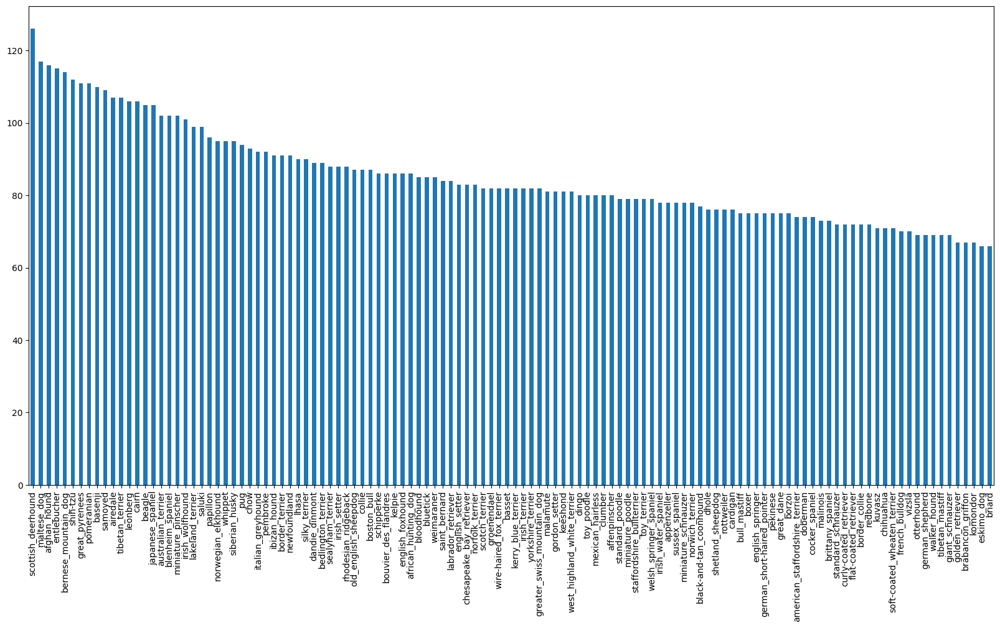

In [ ]:
# How many images are there of each breeds
labels_csv["breed"].value_counts().plot.bar(figsize=(20, 10));

In [ ]:
labels_csv["breed"].value_counts().median()

82.0

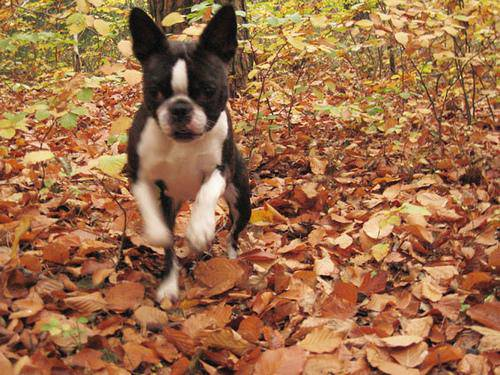

In [ ]:
# Let's view an image

Image("/content/drive/MyDrive/Colab Notebooks/Dog-Vision/data/train/000bec180eb18c7604dcecc8fe0dba07.jpg")

### Getting images and their labels

Let's get a list of all of our image file pathnames.

In [ ]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [ ]:
# Create pathnames from image ID's
filenames = ["/content/drive/MyDrive/Colab Notebooks/Dog-Vision/data/train/"+fname+".jpg" for fname in labels_csv["id"]]

# Check first 10
filenames[:10]

['/content/drive/MyDrive/Colab Notebooks/Dog-Vision/data/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog-Vision/data/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog-Vision/data/train/001cdf01b096e06d78e9e5112d419397.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog-Vision/data/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog-Vision/data/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog-Vision/data/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog-Vision/data/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog-Vision/data/train/002a283a315af96eaea0e28e7163b21b.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog-Vision/data/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog-Vision/data/train/0042188c895a2f14ef6

In [ ]:
# Check whether numbers of filnames matches number of actual image files
import os
if len(os.listdir("/content/drive/MyDrive/Colab Notebooks/Dog-Vision/data/train/"))== len(filenames):
  print("Filenames match actual amount of files!!! Proceed.")
else:
  print("Filenames do not match actual amount of files, check the target directory.")

Filenames match actual amount of files!!! Proceed.


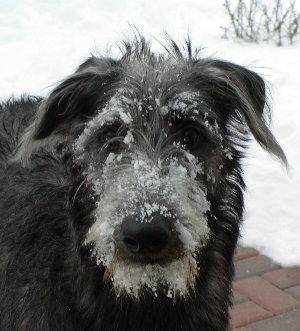

In [ ]:
# One more check
Image(filenames[233])

In [ ]:
labels_csv["breed"][233]

'scottish_deerhound'

Since we've now got our training image filepaths in a list, let's prepare our labels.

In [ ]:
import numpy as np
labels = labels_csv["breed"].to_numpy()
# labels = np.array(labels) does same thing as previous line
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
len(labels)

10222

In [ ]:
# See if number of labels matches the number of filenames
if len(labels) == len(filenames):
  print("Number of labels matches number of filenames!!")
else:
  print("Number of labels matches number of filenames, check data directories!!")

Number of labels matches number of filenames!!


In [ ]:
# Find the unique label values
unique_breeds = np.unique(labels)
len(unique_breeds)

120

In [ ]:
unique_breeds

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [ ]:
# Turn a single labels into an array of booleans
print(labels[0])
labels[0]==unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
# Turn every label into boolean array
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
len(boolean_labels)

10222

In [ ]:
# Example: Turning boolean array into integers
print(labels[0]) # Original label
print(np.where(unique_breeds == labels[0])) # index where label occurs
print(boolean_labels[0].argmax()) # index where label occurs in boolean array
print(boolean_labels[0].astype(int)) # there will be a 1 where the sample label occurs

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [ ]:
print(labels[3])
print(boolean_labels[3].astype(int))

bluetick
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


### Creating our own validation set
Since the dataset from Kaggle doesn;t come with a validation set, we're going to create our own.

In [ ]:
# Setup X & y variables
X = filenames
y = boolean_labels

In [ ]:
len(filenames)

10222

We're going to start off experimenting with ~1000 images and increase as needed.

In [ ]:
# Set number of images to use for experimenting
NUM_IMAGES = 1000 # @param {type:"slider", min:1000, max:10000, step:1000}

In [ ]:
# Let's split our data into train and validation sets
from sklearn.model_selection import train_test_split

# Split them into trainnig and validation of total size NUM_IMAGES
X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES],
                                                    y[:NUM_IMAGES],
                                                    test_size=0.2,
                                                    random_state=42)

In [ ]:
# Let's have a geez at the training data
X_train[:2], y_train[:2]

(['/content/drive/MyDrive/Colab Notebooks/Dog-Vision/data/train/00bee065dcec471f26394855c5c2f3de.jpg',
  '/content/drive/MyDrive/Colab Notebooks/Dog-Vision/data/train/0d2f9e12a2611d911d91a339074c8154.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
 

## Preprocessing Images(turning images into Tensors)

To preprocess our images into Tensors we're going to write a function which we does a few things:
1. Take an image filepath as input
2. Use TensorFlow to read the file and save it to a variable, `image`.
3. Turn our `image` (a jpg) into Tensors.
4. Resize the `image` to be shape of (224,224).
5. Return the modified `image`.

Before we do, let's see what importing an image looks like.

In [ ]:
#  Convert image to NumPy array
from matplotlib.pyplot import imread
image = imread(filenames[42])
image.shape

(257, 350, 3)

In [ ]:
image.max(), image.min()

(255, 0)

In [ ]:
image[:2]
# We can also use numpy array to find pattern
# but after converting into tensors we can find patterns using GPU
# which is much faster then our local CPU

array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]]], dtype=uint8)

In [ ]:
# Turn image into a Tensor
tf.constant(image)[:2]

<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]]], dtype=uint8)>

 Now we've seen what an image looks like as a tensor, let's make a function to preprocess them.

1. Take an image filepath as input
2. Use TensorFlow to read the file and save it to a variable, `image`.
3. Turn our `image` (a jpg) into Tensors.
4. Normalize our `image` (convert color channel values from 0-255 to 0-1).
5. Resize the `image` to be shape of (224,224).
6. Return the modified `image`.


In [ ]:
# Define image size
IMG_SIZE = 224

# Create a function for preprocessing images
def process_image(image_path):
  """
  Takes an image file path and turn the image into a Tensor.
  """
  # Read in an image file
  image = tf.io.read_file(image_path)
  # Turn the jpeg image into numerical Tensor with 3 colour channels(Res, Green, Blue)
  image = tf.image.decode_jpeg(image, channels=3)
  # Convert the colour channels values from 0-255 to 0-1 values
  image = tf.image.convert_image_dtype(image, tf.float32)
  # Resize the image to our desired value(224, 224)
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])

  return image

## Turning our data into batches

Why turn our data into batches?

Let's say you're trying to process 10,000+ images in one go... they all might not fit into memory.

So that's why we do about 32(this is batch size) images at a time(you can manually adjust the batch size if needed be).

In order to use TensorFlow effectively, we need our data in the form of Tensor tuples which look this: `(image, label)`.

In [ ]:
# Creata a simple function to return a tuple (image, label)
def get_image_label(image_path, label):
  """
  Takes an image file path name and the assosciated label,
  processes the image and returns a type of (image, label).
  """
  image = process_image(image_path)
  return image,label

In [ ]:
# Demo of the above
(process_image(X[42]), tf.constant(y[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

Now we've got a way to turn our data into tuples of Tensors in the form: `(image, label)`, let's make a function to turn all of our data(X & y) into batches!

In [ ]:
import tensorflow as tf
# Define the batch size, 32 is a good start
BATCH_SIZE = 32

# Create a funtion to turn data into batches
def create_data_batches(X, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  """
  Creates batches of data out of image(X) and label (y) pairs.
  Shuffles the data if it's training data but doesn't shuffle if it validation data.
  Also accepts test data as input (no labels).
  """

  # If the data is a test dataset, we probably don't have labels
  if test_data:
    print("Creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X))) # only filepaths(no labels)
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch

  # If the data is a valid dataset, we din't need to shuffle it
  elif valid_data:
    print("Creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), # filepaths
                                               tf.constant(y))) # labels
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    print("Creating training data batches...")
    # Turn filepaths and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), # filepaths
                                               tf.constant(y))) # labels
    # Shuffling pathnames and labels before mapping image processor function is faste than shuffling images
    data = data.shuffle(buffer_size=len(X))

    # Create (image, label) tuples(this also turns the image path into a preprocessed image)
    data = data.map(get_image_label)

    # Turn the training data into batches
    data_batch = data.batch(BATCH_SIZE)
  return data_batch

In [ ]:
# Creating training and validation data batches
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data=True)

Creating training data batches...
Creating validation data batches...


In [ ]:
# Check out the different attributes of our data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## Visualizing Data Batches

Our data is now in batches, however, these can be a little hard to understand, let's visualize the

In [ ]:
import matplotlib.pyplot as plt

# Create a function for viewing images in a data batch
def show_25_images(images, labels):
  """
  Displays a plot of 25 images and their labels from a data batch.
  """
  # Setup the figure
  plt.figure(figsize=(10,10))
  # Loop through 25 (for displaying 25 images)
  for i in range(25):
    # Create subplots (5 rows, 5 columns)
    ax = plt.subplot(5, 5, i+1)
    # Display an image
    plt.imshow(images[i])
    # Add the image label as title
    plt.title(unique_breeds[labels[i].argmax()])
    # Turn the grid lines off
    plt.axis("off")

In [ ]:
train_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
train_images, train_labels = next(train_data.as_numpy_iterator())
train_images, train_labels

(array([[[[2.34418772e-02, 2.34418772e-02, 2.34418772e-02],
          [2.34418772e-02, 2.34418772e-02, 2.34418772e-02],
          [2.34418772e-02, 2.34418772e-02, 2.34418772e-02],
          ...,
          [1.69634119e-01, 1.57869413e-01, 1.30418435e-01],
          [1.68163419e-01, 1.56398714e-01, 1.36790872e-01],
          [1.42594233e-01, 1.30829528e-01, 1.11221679e-01]],
 
         [[8.75360856e-05, 8.75360856e-05, 8.75360856e-05],
          [8.75360856e-05, 8.75360856e-05, 8.75360856e-05],
          [8.75360856e-05, 8.75360856e-05, 8.75360856e-05],
          ...,
          [1.76243007e-01, 1.64478302e-01, 1.37027323e-01],
          [1.74721897e-01, 1.62957191e-01, 1.43349349e-01],
          [1.45964548e-01, 1.34199843e-01, 1.14591993e-01]],
 
         [[1.05304634e-02, 1.05304634e-02, 1.05304634e-02],
          [1.05304634e-02, 1.05304634e-02, 1.05304634e-02],
          [1.05304634e-02, 1.05304634e-02, 1.05304634e-02],
          ...,
          [1.91844672e-01, 1.80079952e-01, 1.5262

In [ ]:
len(train_images), len(train_labels)

(32, 32)

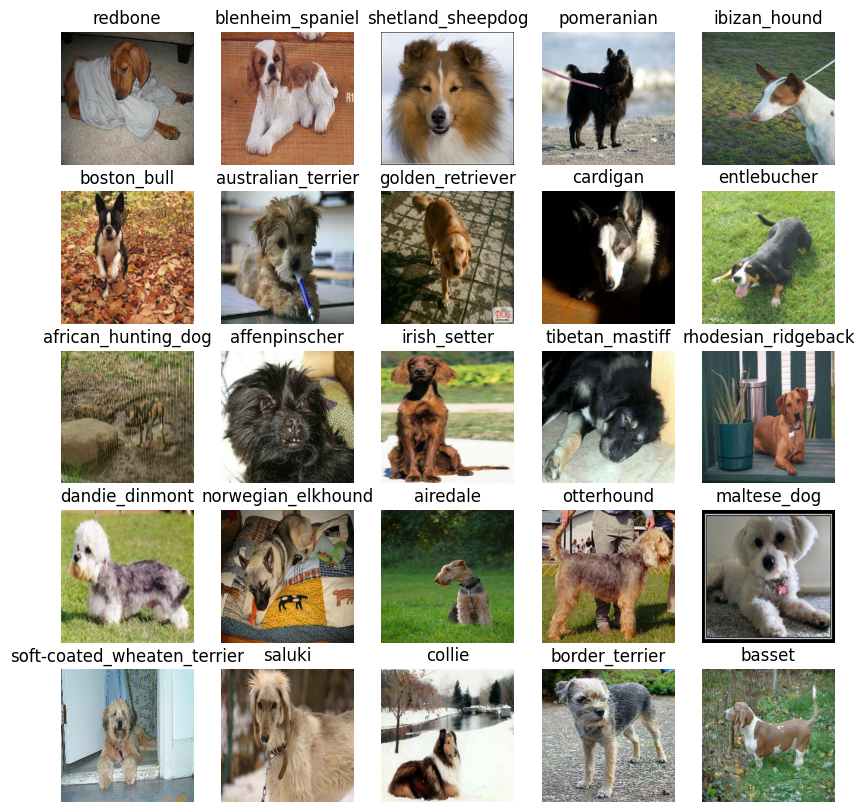

In [ ]:
# Now let's visualize the data in a training batch
show_25_images(train_images, train_labels)

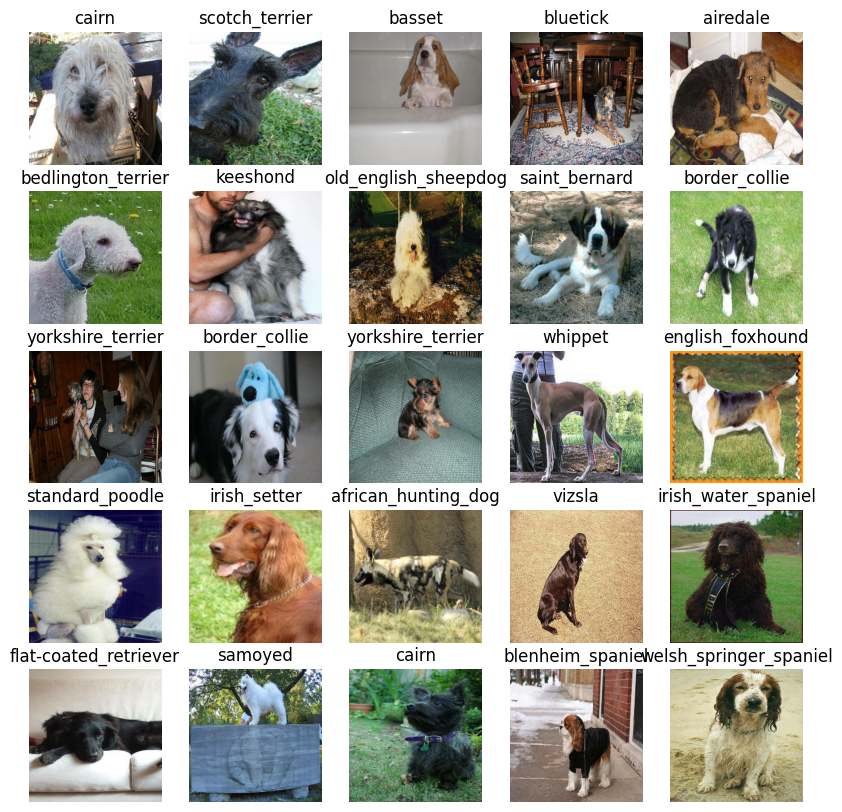

In [ ]:
# Now visualize our validation set
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

## Building our model

Before we build a model, there are a few things we need to define:
* The input shape (our images shape, in the form of Tensors) to our model.
* The output shape (image labels, in the form of Tensors) of our model.
* The URL of the model we want to use.
 https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4


In [ ]:
IMG_SIZE

224

In [ ]:
# Setup input to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] # batch, height, width, colour channels

# Setup output shape of our model
OUTPUT_SHAPE = len(unique_breeds)

# Setup model URL from Tensorflow Hub
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4"

Now we've got our inputs, outputs, and model ready to go. Let's put them together into a Keras deep learning model!

Knowing this, let's create a function which:
* Takes the input shape, output shape and model the we've chosen as parameters.
* Defines the layers in Keras model in sequential fashion (do this first, then this, then that).
* Compiles the model (says it should be evaluates and improved).
* Builds the model(tells the model the input shape it'll be getting).
* Returns the model.

All of these steps can be found here:
https://www.tensorflow.org/guide/keras

In [ ]:
# Create a function which builds a Keras model
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print("Building model with:", MODEL_URL)

  # Setup the model layers
  model = tf.keras.Sequential([
      hub.KerasLayer(MODEL_URL),  # Layer 1 (input layer)
      tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                            activation="softmax")  # Layer 2 (output layer)
      ])

  # Compile the model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(),
      optimizer=tf.keras.optimizers.Adam(),
      metrics=["accuracy"]
  )

  # Build the model
  model.build(INPUT_SHAPE)

  return model

In [ ]:
model = create_model()
model.summary()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5552953 (21.18 MB)
Trainable params: 120240 (469.69 KB)
Non-trainable params: 5432713 (20.72 MB)
_________________________________________________________________


## Creating Callbacks

Callbacks are helper functions a model can use during training to do such things as save its progress. check ots progress or stop training early if a model stops improving.

We'll create two callbacks, one for TensorBoard which helps track our models progress and another for early stopping which prevents our model from training for too long.

### TensorBoard Callback

To setup a TensorBoard callback, we need ot do 3 things:
2. Create a TensorBoard callback which is able to save logs to a directory and pass it our model's `fit()` function.
3. Visualize our models training logs with the `%tensorboard` magic function(we'll do this after model training).

In [ ]:
# Load TensorBoard notebook extension
%load_ext tensorboard

In [ ]:
import datetime

# Create a function to build a TensorBoard callback
def create_tensorboard_callback():
  # Create a log directory for storing TensorBoard logs
  logdir = os.path.join("/content/drive/MyDrive/Colab Notebooks/Dog-Vision/logs",
                        # Make it so the logs get tracked whenever we run an experiment
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

### Early stopping Callback

Early stopping helps stop our model from overfitting by stopping training if a certain evaluation metric stops improving.

https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/EarlyStopping

In [ ]:
# Create early stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy",
                                                  patience=3)

## Training a model (on a subset of data)

Our first model is going to train on 100 images, to make sure everything is working.

In [ ]:
NUM_EPOCHS =  100 # @param {type:"slider", min:10, max:100, step:10}

In [ ]:
# Check to make sure we're still running on a GPU
print("GPU", "available" if tf.config.list_physical_devices("GPU") else "not available")

GPU available


Let's create a function which trains a model.

* Create a model using `create_model()`
* Setup a TensorBoard callback using `create_tensorboard_callback()`
* Call the `fit()` function on our model passing it the training data, validation data, number of epochs to train for (NUM_EPOCHS)  and the callbacks we;d like to use
* Return the model

In [ ]:
# Buils a function to train and return a trained model
def train_model():
  """
  Trains a given model and returns the trained version.
  """
  # Create a model
  model = create_model()

  # Create new TensorBoard session everytime we train a model
  tensorboard = create_tensorboard_callback()

  # Fit teh model to the data passing ot callbacks we created
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data = val_data,
            validation_freq=1,
            callbacks=[tensorboard, early_stopping])
  # Return the fitted model
  return model

In [ ]:
# Fit the model to the data
model = train_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Epoch 1/100
25/25 [==============================] - 242s 9s/step - loss: 4.5524 - accuracy: 0.1175 - val_loss: 3.4178 - val_accuracy: 0.2550
Epoch 2/100
25/25 [==============================] - 4s 163ms/step - loss: 1.6294 - accuracy: 0.6850 - val_loss: 2.1237 - val_accuracy: 0.5050
Epoch 3/100
25/25 [==============================] - 4s 140ms/step - loss: 0.5448 - accuracy: 0.9538 - val_loss: 1.6340 - val_accuracy: 0.5950
Epoch 4/100
25/25 [==============================] - 4s 164ms/step - loss: 0.2432 - accuracy: 0.9887 - val_loss: 1.4944 - val_accuracy: 0.6300
Epoch 5/100
25/25 [==============================] - 4s 168ms/step - loss: 0.1417 - accuracy: 1.0000 - val_loss: 1.4041 - val_accuracy: 0.6400
Epoch 6/100
25/25 [==============================] - 5s 191ms/step - loss: 0.0989 - accuracy: 0.9975 - val_loss: 1.3612 - val_accuracy: 0.6600
Epoch 7/100
25/25 [==============================]

**Question:** It looks like our model is overfitting because it's performing far better in the training dataset than the validation dataset, what are some ways to prevent model overfitting in deep neural networks?

**Note:** Overfitting to begin with is a good thing! It means our model is learining!!!

### Checking the  TensorBoard logs

The TensorBoard magic function (%tensorboard) will access the logs directory we created earlier and visualize its contents.

In [ ]:
%tensorboard --logdir /content/drive/MyDrive/Colab\ Notebooks/Dog-Vision/logs

<IPython.core.display.Javascript object>

## Making and evaluating predictions using a trained model


In [ ]:
# Make predictions on the validation data (not used to train in)
predictions = model.predict(val_data, verbose=1)
predictions

7/7 [==============================] - 2s 111ms/step


array([[4.92995430e-04, 2.75209342e-04, 3.86695354e-03, ...,
        5.46121504e-04, 2.49500408e-05, 3.56858457e-03],
       [9.40121536e-04, 6.44983316e-04, 1.13455858e-02, ...,
        5.25246258e-04, 4.27025091e-03, 1.68979008e-04],
       [1.20183307e-04, 6.93902315e-04, 9.15925339e-05, ...,
        5.38375927e-04, 1.36717907e-04, 1.78259026e-04],
       ...,
       [2.14441097e-05, 1.21998964e-04, 6.48266650e-05, ...,
        3.25206638e-05, 2.89009709e-04, 2.04797310e-04],
       [5.67190489e-03, 1.36277743e-03, 3.10113042e-04, ...,
        5.62106085e-04, 6.76791242e-04, 1.90450195e-02],
       [5.80405397e-03, 1.54845591e-04, 5.60395513e-03, ...,
        9.54848481e-04, 1.10195507e-03, 2.20410380e-04]], dtype=float32)

In [ ]:
np.sum(predictions[0])

1.0000001

In [ ]:
# First prediction
index=0
print(predictions[index])
print(f"Max value (probablity of prediction):{np.max(predictions[index])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Max index: {np.argmax(predictions[index])}")
print(f"Predcted label: {unique_breeds[np.argmax(predictions[index])]}")

[4.92995430e-04 2.75209342e-04 3.86695354e-03 2.27819124e-04
 3.20624036e-04 2.41688504e-05 1.95697471e-02 1.34969293e-03
 5.20047142e-05 2.37661865e-04 9.99269178e-05 1.11878697e-04
 8.65155816e-05 6.98190634e-05 2.56116095e-04 3.18973500e-04
 2.93926678e-05 5.10659218e-01 4.97464134e-06 6.29883871e-05
 2.09159218e-03 1.73246226e-04 5.95710344e-06 1.55855156e-03
 5.56110244e-05 1.64088211e-04 1.32297054e-01 1.02832237e-04
 7.82747113e-04 1.64820638e-04 1.40803881e-04 7.09741435e-04
 1.57042069e-03 1.53650599e-05 3.28162656e-04 1.03392415e-02
 4.80416675e-05 1.07373483e-03 2.61378937e-05 6.09513045e-05
 8.81138665e-04 3.06126021e-05 6.59352663e-05 9.09667069e-05
 8.67070139e-06 1.09594810e-04 1.07987271e-05 2.07139674e-04
 2.56048061e-05 6.64709005e-05 8.97539940e-05 4.10507419e-05
 4.93524829e-04 4.16398907e-05 8.03934599e-05 6.60234800e-05
 7.03313708e-05 1.06805749e-03 2.51220074e-04 1.91800930e-02
 1.92530060e-04 2.61872192e-05 6.78023847e-04 1.86070829e-05
 8.89293733e-04 8.019841

Having the above functionality is great but we want to able to do it at scale.

And it would be even better if we could see the image the prediction is being made on!

**Note:** Predicition probablities are also known as confidence levels.

In [ ]:
# Turn predicition probabilities into their respective label (easier to understand)
def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilitirs into a label.
  """
  return unique_breeds[np.argmax(prediction_probabilities)]

# Get a prediction label based on an array of prediciton probabilities
pred_label = get_pred_label(predictions[81])
pred_label

'cardigan'

Now since our validation data is still in a batch dataset, we'll have to unbatchify it to make predictions on the validation images and then compare those predictions to the validation labels(truth labels).

In [ ]:
# Create a function to unbatch a batch dataset
def unbatchify(data):
  """
  Takes a batched dataset of (image, label) Tensors and returns separate arrays
  of images and labels.
  """
  images = []
  labels = []

  # Loop through unbatched data
  for image, label in val_data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images, labels

# Unbatchify the validation data
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

Now we've got ways to get:
* Prediction labels
* Validation labels(truth labels)
* Validation images

Let's make some function to make these all a bit more visualize.

We'll create a function which:
* Takes an array of prediction probabilites, an array of truth labels and an array of images and an integers.✅
* Convert the prediction probabilities to predict label.✅
* Plot the predicted label, its predicited probability, the truth label and target image on a single plot.✅

In [ ]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  View the prediction, ground truth and image for sample n
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  # Get the pred label
  pred_label = get_pred_label(pred_prob)

  # Plot image & remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the colour of the title depending on if the prediciton is right or wrong
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"

  # Change plot title to be predicted, probability of prediction and truth label
  plt.title("{} {:2.0f}% {}".format(pred_label,
                                    np.max(pred_prob)*100,
                                    true_label),
                                    color=color)

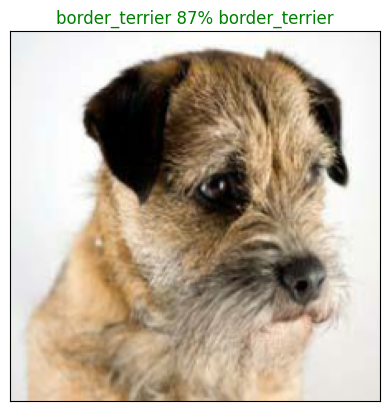

In [ ]:
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images,
          n=56)

Now we've got one function to visualize our models top prediciton, let's make another to view our models top 10 predicitons

This function will:
* Take an input of prediction probablities array and a ground truth array and an integer.✅
* Find the prediction using `get_pred_label()`.✅
* Find the top 10:
  * Prediction probabilities indexes
  * Prediction probabilities values
  * Predcition labels
* Plot the top 10 prediction probability values and labals, coloring th true label green

In [ ]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Plus the top 10 highest predicition confidences along with the truth label for sample n.
  """
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # Get the prediciton label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 prediciton confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
  # Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]
  # Find top 10 prediciton labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")

  # Change the color of true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass

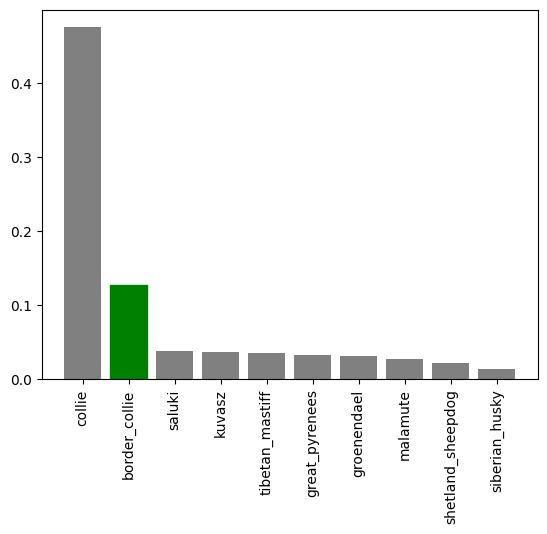

In [ ]:
plot_pred_conf(prediction_probabilities=predictions,
               labels=val_labels,
               n=9)

Now we've got some function to help us visualize our predictions and evaluate our model, let's check out a few.

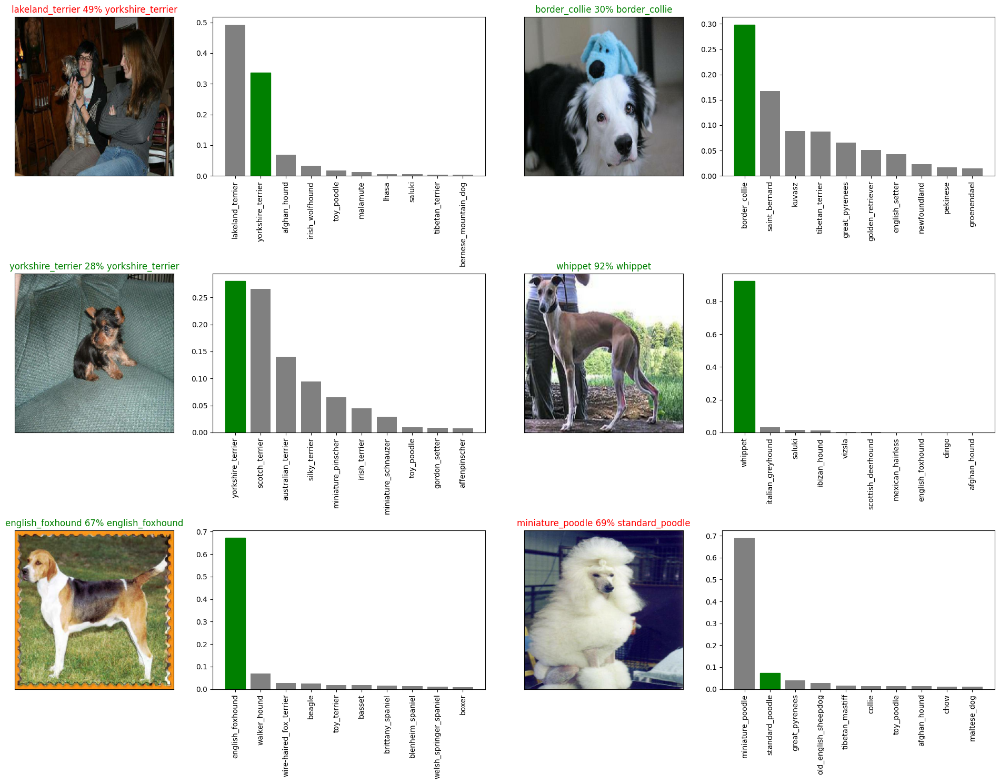

In [ ]:
# Let's check out a few predictions and their different values
i_multiplier = 10
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(10*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities = predictions,
            labels = val_labels,
            images = val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                 labels=val_labels,
                 n=i+i_multiplier)
  plt.tight_layout(h_pad=1.0)
plt.show()

## Saving and reloading a trained model


In [ ]:
# Create a function to save a model
def save_model(model, suffix=None):
  """
  Saves a given model in a models directory and appends a suffix (string).
  """
  # Create a model directory pathname with current time
  modeldir = os.path.join("/content/drive/MyDrive/Colab Notebooks/Dog-Vision/models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = modeldir + "-" + suffix + ".h5" # Save format of model
  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path

In [ ]:
# Create a function to load a trained model
def load_model(model_path):
  """
  Loads a saved model from a specified path.
  """
  print(f"Loading saved model from: {model_path}")
  model = tf.keras.models.load_model(model_path,
                                    custom_objects={"KerasLayer":hub.KerasLayer})
  return model

Now we've got functions to save and load a trained model, let's make sure they work!

In [ ]:
# Save our model
save_model(model, suffix="1000-images-mobilenetv2-Adam")

Saving model to: /content/drive/MyDrive/Colab Notebooks/Dog-Vision/models/20240124-10151706091311-1000-images-mobilenetv2-Adam.h5...


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'/content/drive/MyDrive/Colab Notebooks/Dog-Vision/models/20240124-10151706091311-1000-images-mobilenetv2-Adam.h5'

In [ ]:
# Load a trained model
loaded_1000_image_model = load_model("/content/drive/MyDrive/Colab Notebooks/Dog-Vision/models/20231221-04321703133129-1000-images-mobilenetv2-Adam.h5")

Loading saved model from: /content/drive/MyDrive/Colab Notebooks/Dog-Vision/models/20231221-04321703133129-1000-images-mobilenetv2-Adam.h5


In [ ]:
# Evaluate the pre-saved model
model.evaluate(val_data)

7/7 [==============================] - 1s 129ms/step - loss: 1.3043 - accuracy: 0.6750


[1.3042761087417603, 0.675000011920929]

In [ ]:
# Evalute the loaded model
loaded_1000_image_model.evaluate(val_data)

7/7 [==============================] - 1s 109ms/step - loss: 1.3275 - accuracy: 0.6450


[1.327451229095459, 0.6449999809265137]

## Training a big dog model (on the full dataset)

In [ ]:
# Create a data batch with the full data set
full_data = create_data_batches(X, y)

Creating training data batches...


In [ ]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# Create a model for full model
full_model = create_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4


In [ ]:
# Create full model callbacks
full_model_tensorboard = create_tensorboard_callback()
# No validation set when training on all data, so we can't monitor validation accuracy
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy",
                                                             patience=3)

**Note:** Running the cell below will take a little while (maybe up to 30 minutes for the first epoch) because the GPU we're using in the runtime has to load all of the images into memory.

In [ ]:
# Fit the full model to the full data
# full_model.fit(x=full_data,
              #  epochs=NUM_EPOCHS,
              #  callbacks=[full_model_tensorboard, full_model_early_stopping])

In [ ]:
# save_model(full_model, suffix="full-image-set-mobilenetv2-Adam")

In [ ]:
# Load in the full model
loaded_full_model = load_model("/content/drive/MyDrive/Colab Notebooks/Dog-Vision/models/20231201-15041701443054-full-image-set-mobilenetv2-Adam.h5")

Loading saved model from: /content/drive/MyDrive/Colab Notebooks/Dog-Vision/models/20231201-15041701443054-full-image-set-mobilenetv2-Adam.h5


## Making predictions on the dataset

Since our model has been trained on images in the form of Tensor batches, to make predictions on the test data, we'll have to get it into the same format.

Luckily we created `create_data_batches()` earlier which can take a list of filenames as input and convert them into Tensor batches.

To make predictions on the test data, we'll:
* Get the test image filenames.✅
* Convert the filenames into test batches using `create_data_batches()` and setting the `test_data` parameter to `True` (since the tst data doesn't have labels).✅
* Make a predictions array by passing the test batches to the `predict()` method called on our model.✅

In [ ]:
# Load test image filenames
test_path = "/content/drive/MyDrive/Colab Notebooks/Dog-Vision/data/test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['/content/drive/MyDrive/Colab Notebooks/Dog-Vision/data/test/dff6d0e5746812e0e5808c0e69a20574.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog-Vision/data/test/e00a1b26edd5cb7323e3b75ce37b36f6.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog-Vision/data/test/e4413cd1ee44a05cc7991ae0d097b062.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog-Vision/data/test/e09a3a40b2ebdf0be72800eefd6931de.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog-Vision/data/test/e14cc46044a0fb31554250b07c93bd48.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog-Vision/data/test/deec42d608968cccb3ab91e306194fed.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog-Vision/data/test/e6223aba45a94c9ac349967ed946d0f7.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog-Vision/data/test/dddb2b191e1b1de4867f6f5e81236312.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog-Vision/data/test/e24b2d063b3ad699d5eba7a01e4ae956.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog-Vision/data/test/e21d378710d164f126e7d0b380dc7

In [ ]:
# Create test data batch
test_data = create_data_batches(test_filenames, test_data=True)

Creating test data batches...


In [ ]:
test_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

**Note:** Calling `predict()` on our full model passing it the test data batch will take a long time to run(about a ~hr). This is because we have to process ~10,000+ images and get our model to find patterns in those images and generate predictions based on what its learned in the training dataset.

In [ ]:
# Make predictions on the test data batch using the loaded full model
test_predictions = loaded_full_model.predict(test_data,
                                             verbose=1)

324/324 [==============================] - 208s 629ms/step


In [ ]:
# Save predictions (Numpy array) to csv file (for access later)
np.savetxt("/content/drive/MyDrive/Colab Notebooks/Dog-Vision/preds_array.csv", test_predictions, delimiter=",")

In [ ]:
# Load predicitons (Numpy array) from csv file
import numpy as np
test_predictions = np.loadtxt("/content/drive/MyDrive/Colab Notebooks/Dog-Vision/preds_array.csv", delimiter=",")

In [ ]:
test_predictions[:10]

array([[5.69085671e-07, 1.31680267e-14, 5.04891906e-10, ...,
        3.14773218e-13, 1.68099689e-07, 3.76408425e-04],
       [3.31451446e-13, 1.52715351e-08, 3.28043565e-11, ...,
        2.54691546e-10, 3.72000318e-06, 2.99252036e-08],
       [1.48359727e-10, 6.90686341e-10, 2.11689014e-10, ...,
        2.12902265e-07, 1.57339175e-09, 1.02663315e-10],
       ...,
       [1.28016966e-12, 2.13944973e-11, 4.87695116e-13, ...,
        5.88032744e-05, 7.58852096e-12, 6.79879070e-12],
       [1.67699206e-08, 4.27835266e-06, 2.77572866e-07, ...,
        8.98640735e-07, 1.33779840e-05, 1.56105759e-08],
       [1.49347668e-09, 3.10890369e-10, 5.92243919e-13, ...,
        1.86974578e-08, 6.59550103e-09, 1.56298512e-08]])

## Preparing test dataset predictions for Kaggle

Looking at the Kaggle sample submission, we find that it wants our models predcition probability outputs in a DataFrame with an ID and a column for each different dog
breed.


To get the data in this format, we'll:
* Create a pandas DataFrame with an ID Column as well as a column for each dog breed
* Add data to the ID column by extracting the test image ID's from their filepaths.
* Add data(the prediction probabilities) to each of the dog breed columns.
* Export the DataFrame as a CSV to submit it to Kaggle.

In [ ]:
# Create a pandas DataFrame with empty columns
preds_df = pd.DataFrame(columns=["id"]+list(unique_breeds))
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [ ]:
# Append test image ID's to predictions DataFrame
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_df["id"] = test_ids

In [ ]:
# Add the prediciton probabilities to each dog breed column
preds_df[list(unique_breeds)] = test_predictions
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,dff6d0e5746812e0e5808c0e69a20574,5.690857e-07,1.316803e-14,5.048919e-10,1.088470e-14,1.988891e-10,3.454397e-14,8.548475e-10,1.041793e-08,5.626996e-11,...,7.436559e-09,9.411372e-08,1.335364e-11,1.497670e-10,4.245082e-11,1.310837e-09,9.994341e-01,3.147732e-13,1.680997e-07,3.764084e-04
1,e00a1b26edd5cb7323e3b75ce37b36f6,3.314514e-13,1.527154e-08,3.280436e-11,4.946072e-08,6.201865e-10,2.719889e-10,4.110329e-07,8.683901e-09,7.854920e-06,...,8.147611e-10,3.462994e-11,9.967196e-06,1.847922e-05,5.601275e-09,8.331870e-11,5.470689e-12,2.546915e-10,3.720003e-06,2.992520e-08
2,e4413cd1ee44a05cc7991ae0d097b062,1.483597e-10,6.906863e-10,2.116890e-10,4.048174e-09,2.163966e-08,1.515247e-06,1.666273e-09,7.991475e-08,3.211805e-07,...,3.187099e-09,5.661221e-11,1.595160e-09,2.767733e-05,1.065553e-09,1.538138e-09,1.088733e-09,2.129023e-07,1.573392e-09,1.026633e-10
3,e09a3a40b2ebdf0be72800eefd6931de,1.230694e-07,9.644597e-11,9.636125e-10,1.317117e-10,1.700366e-08,5.603761e-12,2.307884e-07,1.255278e-09,3.081255e-09,...,2.272815e-06,9.024873e-10,2.468282e-08,1.082536e-10,6.109287e-09,2.268820e-11,2.280977e-06,2.719268e-11,4.744297e-09,1.016166e-08
4,e14cc46044a0fb31554250b07c93bd48,1.103526e-12,3.529432e-06,1.291938e-08,1.331364e-10,3.421392e-15,8.997406e-14,3.114583e-11,4.383098e-13,7.946586e-08,...,9.791153e-11,3.332449e-14,7.403628e-06,2.429960e-11,1.863403e-11,7.691358e-13,1.611676e-14,4.177242e-08,4.466024e-07,9.576114e-11


In [ ]:
# Save our predictions dataframe to CSV for submission to Kaggle
preds_df.to_csv("/content/drive/MyDrive/Colab Notebooks/Dog-Vision/full_model_predictiond_submission_1_mobilenetV2",
                index=False)

## Making prediction on custom images

To make predictions on custom images, we'll:
* Get the filepaths of our own images.
* Turn the filepaths into data batches using `create_data_batches()`. And since our custom images won't have labels, we set the `test_data` parameter to `True`.
* Pass the custom image data batch to our model's `predict()` method.
* Convert the prediction output probabilities to predcitions labels.
* Compare the predicited labels to the custom images.

In [ ]:
import os
# Get custom image filepaths
custom_path = "/content/drive/MyDrive/Colab Notebooks/Dog-Vision/dog_photos/"
custom_image_paths = [custom_path + fname for fname in os.listdir(custom_path)]

In [ ]:
custom_image_paths

['/content/drive/MyDrive/Colab Notebooks/Dog-Vision/dog_photos/husky.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog-Vision/dog_photos/german_shephard.jpeg',
 '/content/drive/MyDrive/Colab Notebooks/Dog-Vision/dog_photos/download.jpeg',
 '/content/drive/MyDrive/Colab Notebooks/Dog-Vision/dog_photos/images.jpeg',
 '/content/drive/MyDrive/Colab Notebooks/Dog-Vision/dog_photos/images (1).jpeg',
 '/content/drive/MyDrive/Colab Notebooks/Dog-Vision/dog_photos/WhatsApp Image 2023-12-04 at 11.53.04_fc744e24.jpg']

In [ ]:
# Turn custom images into batch datasets
custom_data = create_data_batches(custom_image_paths, test_data=True)
custom_data

Creating test data batches...


<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [ ]:
# Make predictions onm the custom data
custom_preds = loaded_full_model.predict(custom_data)

1/1 [==============================] - 2s 2s/step


In [ ]:
custom_preds.shape

(6, 120)

In [ ]:
# Get custom image prediction labels
custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

['siberian_husky',
 'german_shepherd',
 'pug',
 'rottweiler',
 'weimaraner',
 'groenendael']

In [ ]:
# Get custom images (our unbatchify() funtion won't  work since there aren't labels... maybe we could fix this later)
custom_images = []
# Loop through unbatched data
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

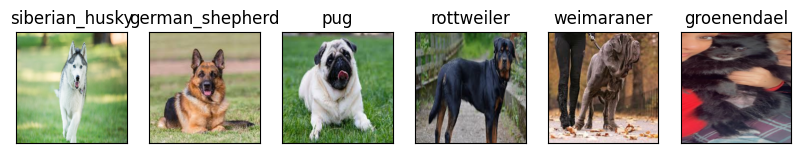

In [ ]:
# Check custom image predictions
plt.figure(figsize=(10,10))
for i, image in enumerate(custom_images):
  plt.subplot(1, 6, i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)